In [1]:
%matplotlib inline
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import scipy.misc
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import torchvision.models as models
import copy

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


## Load imgae and show example

In [3]:
def image_loader(image_name, imsize=512):
    loader = transforms.Compose([
        transforms.Resize(imsize),  # scale imported image
        transforms.ToTensor()])  # transform it into a torch tensor
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

# example images
content_img = image_loader("./cat.jpg")
# resize the style image with respect to content image
style_img = image_loader("./2-style2.jpg", content_img.size()[2:])

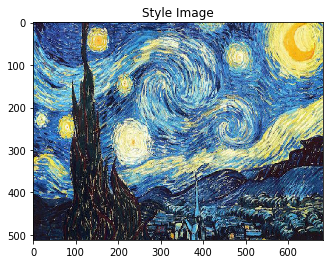

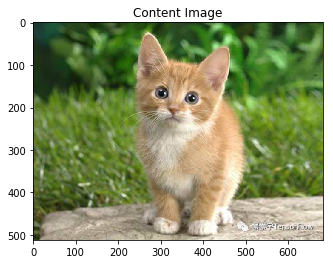

In [4]:
unloader = transforms.ToPILImage()  # reconvert into PIL image

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated


plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

Loss Functions
--------------
Content Loss
~~~~~~~~~~~~

The content loss is a function that represents a weighted version of the
content distance for an individual layer. The function takes the feature
maps $F_{XL}$ of a layer $L$ in a network processing input $X$ and returns the
weighted content distance $w_{CL}.D_C^L(X,C)$ between the image $X$ and the
content image $C$. The feature maps of the content image($F_{CL}$) must be
known by the function in order to calculate the content distance. We
implement this function as a torch module with a constructor that takes
$F_{CL}$ as an input. The distance $\|F_{XL} - F_{CL}\|^2$ is the mean square error
between the two sets of feature maps, and can be computed using ``nn.MSELoss``.

We will add this content loss module directly after the convolution
layer(s) that are being used to compute the content distance. This way
each time the network is fed an input image the content losses will be
computed at the desired layers and because of auto grad, all the
gradients will be computed. Now, in order to make the content loss layer
transparent we must define a ``forward`` method that computes the content
loss and then returns the layer’s input. The computed loss is saved as a
parameter of the module.




In [5]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        # we 'detach' the target content from the tree used
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

.. Note::
   **Important detail**: although this module is named ``ContentLoss``, it
   is not a true PyTorch Loss function. If you want to define your content
   loss as a PyTorch Loss function, you have to create a PyTorch autograd function 
   to recompute/implement the gradient manually in the ``backward``
   method.



Style Loss
~~~~~~~~~~

The style loss module is implemented similarly to the content loss
module. It will act as a transparent layer in a
network that computes the style loss of that layer. In order to
calculate the style loss, we need to compute the gram matrix $G_{XL}$. A gram
matrix is the result of multiplying a given matrix by its transposed
matrix. In this application the given matrix is a reshaped version of
the feature maps $F_{XL}$ of a layer $L$. $F_{XL}$ is reshaped to form $\hat{F}_{XL}$, a $K$\ x\ $N$
matrix, where $K$ is the number of feature maps at layer $L$ and $N$ is the
length of any vectorized feature map $F_{XL}^k$. For example, the first line
of $\hat{F}_{XL}$ corresponds to the first vectorized feature map $F_{XL}^1$.

Finally, the gram matrix must be normalized by dividing each element by
the total number of elements in the matrix. This normalization is to
counteract the fact that $\hat{F}_{XL}$ matrices with a large $N$ dimension yield
larger values in the Gram matrix. These larger values will cause the
first layers (before pooling layers) to have a larger impact during the
gradient descent. Style features tend to be in the deeper layers of the
network so this normalization step is crucial.




In [6]:
def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)

Now the style loss module looks almost exactly like the content loss
module. The style distance is also computed using the mean square
error between $G_{XL}$ and $G_{SL}$.




In [7]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

## Importing the Model

In [8]:
cnn_vgg19 = models.vgg19(pretrained=True).features.to(device).eval()

In [9]:
cnn_vgg19_bn = models.vgg19_bn(pretrained=True).features.to(device).eval()

Downloading: "https://download.pytorch.org/models/vgg19_bn-c79401a0.pth" to /datasets/home/62/762/shg034/.torch/models/vgg19_bn-c79401a0.pth
100%|██████████| 574769405/574769405 [00:10<00:00, 55044199.95it/s]


In [10]:
cnn_res34 = nn.Sequential(*list(models.resnet34(pretrained=True).children())[:-2]).to(device).eval()

In [11]:
cnn_res151 = nn.Sequential(*list(models.resnet152(pretrained=True).children())[:-2]).to(device).eval()

If we use initial normalization:
VGG networks are trained on images with each channel
normalized by mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225].
We will use them to normalize the image before sending it into the network.




In [12]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

# create a module to normalize input image so we can easily put it in a
# nn.Sequential
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std

A ``Sequential`` module contains an ordered list of child modules. For
instance, ``vgg19.features`` contains a sequence (Conv2d, ReLU, MaxPool2d,
Conv2d, ReLU…) aligned in the right order of depth. We need to add our
content loss and style loss layers immediately after the convolution
layer they are detecting. To do this we must create a new ``Sequential``
module that has content loss and style loss modules correctly inserted.




In [13]:
# default style/content losses :
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img, net_type=("vgg", 19),
                               content_layers=content_layers_default,
                               style_layers=style_layers_default, init_norm=True):
    cnn = copy.deepcopy(cnn)
    
    content_losses = []
    style_losses = []

    # normalization module
    if init_norm:
        normalization = Normalization(normalization_mean, normalization_std).to(device)

        # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
        # to put in modules that are supposed to be activated sequentially
        model = nn.Sequential(normalization)
    else:
        model = nn.Sequential()

    if net_type[0] == "vgg":
        i = 0  # increment every time we see a conv
        for layer in cnn.children():
            if isinstance(layer, nn.Conv2d):
                i += 1
                name = 'conv_{}'.format(i)
            elif isinstance(layer, nn.ReLU):
                name = 'relu_{}'.format(i)
                # The in-place version doesn't play very nicely with the ContentLoss
                # and StyleLoss we insert below. So we replace with out-of-place
                # ones here.
                layer = nn.ReLU(inplace=False)
            elif isinstance(layer, nn.MaxPool2d):
                name = 'pool_{}'.format(i)
            elif isinstance(layer, nn.BatchNorm2d):
                name = 'bn_{}'.format(i)
            else:
                raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

            model.add_module(name, layer)

            if name in content_layers:
                # add content loss:
                target = model(content_img).detach()
                content_loss = ContentLoss(target)
                model.add_module("content_loss_{}".format(i), content_loss)
                content_losses.append(content_loss)

            if name in style_layers:
                # add style loss:
                target_feature = model(style_img).detach()
                style_loss = StyleLoss(target_feature)
                model.add_module("style_loss_{}".format(i), style_loss)
                style_losses.append(style_loss)
    
    # botnet{l}_{b}
    elif net_type[0] == "res":
        l = 0
        temp = True
        for layer in cnn.children():
            if isinstance(layer, nn.Conv2d):
                name = 'conv_start'
            elif isinstance(layer, nn.ReLU):
                name = 'relu_start'
                # The in-place version doesn't play very nicely with the ContentLoss
                # and StyleLoss we insert below. So we replace with out-of-place
                # ones here.
                layer = nn.ReLU(inplace=False)
            elif isinstance(layer, nn.MaxPool2d):
                name = 'pool_start'
            elif isinstance(layer, nn.BatchNorm2d):
                name = 'bn_start'
            elif isinstance(layer, nn.Sequential):
                temp = False
                l += 1
                b = 0
                for sublayer in layer.children():
                    if net_type[1] in [18, 34]:
                        if isinstance(sublayer, models.resnet.BasicBlock):
                            b += 1
                            name = 'botnet{}_{}'.format(l, b)             
                        else:
                            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))
                    elif net_type[1] in [50, 101, 152]:
                        if isinstance(sublayer, models.resnet.Bottleneck):
                            b += 1
                            name = 'botnet{}_{}'.format(l, b)             
                        else:
                            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))
                    else:
                        raise RuntimeError('Unexpected model layer input')
                        
                    model.add_module(name, sublayer)
                    
                    #i = 0
                    #for subsublayer in sublayer.children():
                    #    if isinstance(subsublayer, nn.Conv2d):
                    #        i += 1
                    #        name = name + '_conv{}'.format(i)
                    #    elif isinstance(subsublayer, nn.ReLU):
                    #        name = name + '_relu{}'.format(i)
                    #        subsublayer = nn.ReLU(inplace=False)
                    #    elif isinstance(subsublayer, nn.BatchNorm2d):
                    #        name = name + '_bn{}'.format(i)
                    
                    if name in content_layers:
                        # add content loss:
                        target = model(content_img).detach()
                        content_loss = ContentLoss(target)
                        model.add_module("content_loss_{}".format(l), content_loss)
                        content_losses.append(content_loss)

                    if name in style_layers:
                        # add style loss:
                        target_feature = model(style_img).detach()
                        style_loss = StyleLoss(target_feature)
                        model.add_module("style_loss_{}".format(l), style_loss)
                        style_losses.append(style_loss)

            else:
                continue
            
            if temp:
                model.add_module(name, layer)

                if name in content_layers:
                    # add content loss:
                    target = model(content_img).detach()
                    content_loss = ContentLoss(target)
                    model.add_module("content_loss_{}".format(i), content_loss)
                    content_losses.append(content_loss)

                if name in style_layers:
                    # add style loss:
                    target_feature = model(style_img).detach()
                    style_loss = StyleLoss(target_feature)
                    model.add_module("style_loss_{}".format(i), style_loss)
                    style_losses.append(style_loss)
        
    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]
    
    print(model)

    return model, style_losses, content_losses

Gradient Descent
----------------

As Leon Gatys, the author of the algorithm, suggested `here <https://discuss.pytorch.org/t/pytorch-tutorial-for-neural-transfert-of-artistic-style/336/20?u=alexis-jacq>`__, we will use
L-BFGS algorithm to run our gradient descent. Unlike training a network,
we want to train the input image in order to minimise the content/style
losses. We will create a PyTorch L-BFGS optimizer ``optim.LBFGS`` and pass
our image to it as the tensor to optimize.




In [14]:
def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img.requires_grad_()])
    return optimizer

Finally, we must define a function that performs the neural transfer. For
each iteration of the networks, it is fed an updated input and computes
new losses. We will run the ``backward`` methods of each loss module to
dynamicaly compute their gradients. The optimizer requires a “closure”
function, which reevaluates the modul and returns the loss.

We still have one final constraint to address. The network may try to
optimize the input with values that exceed the 0 to 1 tensor range for
the image. We can address this by correcting the input values to be
between 0 to 1 each time the network is run.




In [15]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, net_type=("vgg", 19), num_steps=300,
                       style_weight=1000000, content_weight=1,
                       content_layers=content_layers_default,
                       style_layers=style_layers_default, init_norm=True):
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img, net_type=net_type, content_layers=content_layers,
                               style_layers=style_layers, init_norm=init_norm)
    optimizer = get_input_optimizer(input_img)

    result_img_list = []
    loss_style = []
    loss_cont = []
    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()
            loss_style.append(style_score)
            loss_cont.append(content_score)

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                temp = copy.deepcopy(input_img)
                result_img_list.append(temp)

            return style_score + content_score

        optimizer.step(closure)

    # a last correction...
    input_img.data.clamp_(0, 1)

    #return input_img
    return result_img_list, loss_style, loss_cont

## Experiments

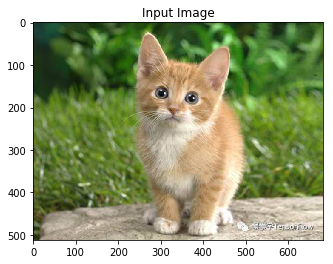

In [16]:
input_img = content_img.clone()
# if you want to use white noise instead uncomment the below line:
#input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:
plt.figure()
imshow(input_img, title='Input Image')

## VGG19 without BN, with init_Norm, uniform style loss layer after relu

In [30]:
CONTENT_LAYERS = ('relu_10', 'relu_14')
STYLE_LAYERS = ('relu_1', 'relu_2' 'relu_3', 'relu_5', 'relu_9', 'relu_13')
premodel = cnn_vgg19
steps = 300

Building the style transfer model..
Sequential(
  (0): Normalization()
  (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_1): ReLU()
  (style_loss_1): StyleLoss()
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_2): ReLU()
  (pool_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_3): ReLU()
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_4): ReLU()
  (pool_4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_5): ReLU()
  (style_loss_5): StyleLoss()
  (conv_6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_6): ReLU()
  (conv_7): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_7): ReLU()
  (conv_

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


run [50]:
Style Loss : 0.976450 Content Loss: 1.881164
run [100]:
Style Loss : 0.844721 Content Loss: 1.565852
run [150]:
Style Loss : 0.801805 Content Loss: 1.448162
run [200]:
Style Loss : 0.778301 Content Loss: 1.385821
run [250]:
Style Loss : 0.763622 Content Loss: 1.348190
run [300]:
Style Loss : 0.754176 Content Loss: 1.322438


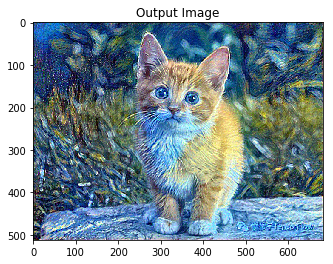

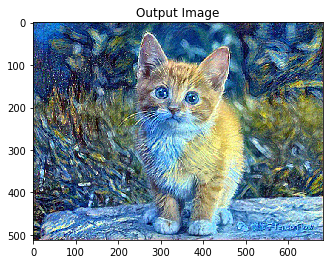

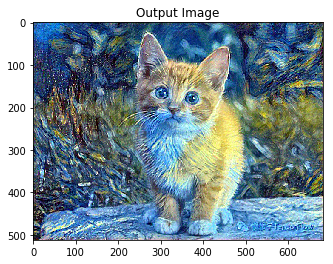

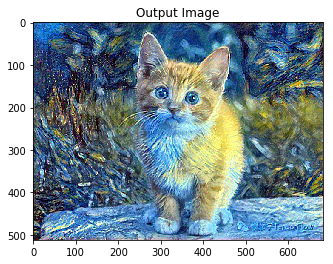

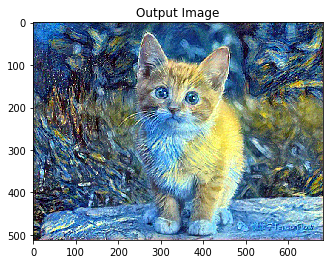

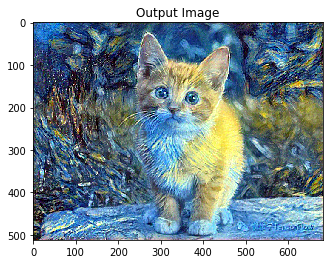

In [31]:
outputs, style_loss, cont_loss = run_style_transfer(premodel, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=steps, content_layers=CONTENT_LAYERS, style_layers=STYLE_LAYERS)

for out in outputs:
    plt.figure()
    imshow(out, title='Output Image')

    # sphinx_gallery_thumbnail_number = 4
    plt.ioff()
    plt.show()

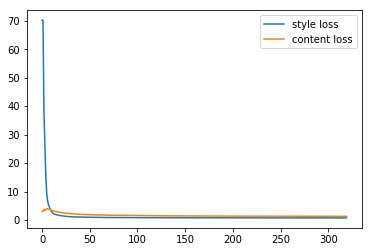

In [32]:
import numpy as np

ax = plt.subplot(111)

t = np.arange(0, 320, 1)
line, = plt.plot(t, style_loss, label='style loss')
line, = plt.plot(t, cont_loss, label='content loss')
plt.legend(loc='best')
plt.show()

## VGG19 with BN, without init_Norm, uniform style loss layer after relu

In [23]:
CONTENT_LAYERS = ('relu_10', 'relu_14')
STYLE_LAYERS = ('relu_1', 'relu_2' 'relu_3', 'relu_5', 'relu_9', 'relu_13')
premodel = cnn_vgg19_bn
steps = 300

Building the style transfer model..
Sequential(
  (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu_1): ReLU()
  (style_loss_1): StyleLoss()
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn_2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu_2): ReLU()
  (pool_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn_3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu_3): ReLU()
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn_4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu_4): ReLU()
  (pool_4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=Fal

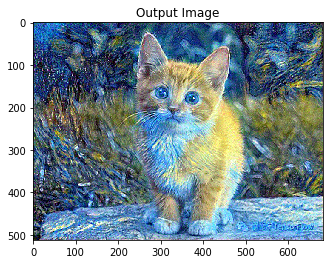

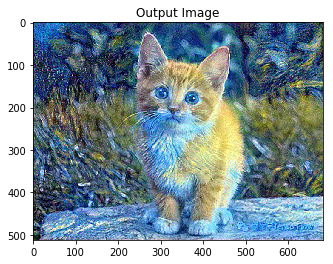

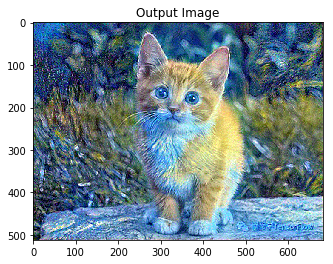

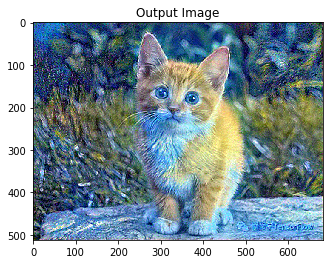

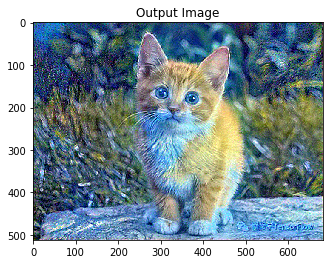

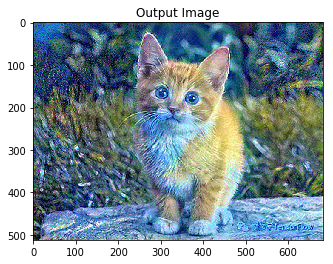

In [24]:
outputs, style_loss, cont_loss = run_style_transfer(premodel, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=steps, content_layers=CONTENT_LAYERS, style_layers=STYLE_LAYERS, init_norm=False)

for out in outputs:
    plt.figure()
    imshow(out, title='Output Image')

    # sphinx_gallery_thumbnail_number = 4
    plt.ioff()
    plt.show()

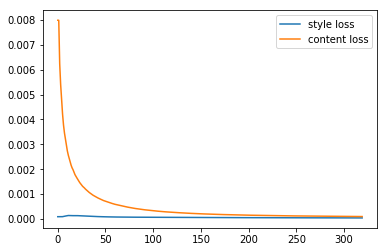

In [26]:
ax = plt.subplot(111)

t = np.arange(0, 320, 1)
line, = plt.plot(t, style_loss, label='style loss')
line, = plt.plot(t, cont_loss, label='content loss')
plt.legend(loc='best')
plt.show()

## VGG19 with BN, without init_Norm, uniform style loss layer after bn

In [27]:
CONTENT_LAYERS = ('bn_10', 'bn_14')
STYLE_LAYERS = ('bn_1', 'bn_2' 'bn_3', 'bn_5', 'bn_9', 'bn_13')
premodel = cnn_vgg19_bn
steps = 300

Building the style transfer model..
Sequential(
  (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (style_loss_1): StyleLoss()
  (relu_1): ReLU()
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn_2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu_2): ReLU()
  (pool_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn_3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu_3): ReLU()
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn_4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu_4): ReLU()
  (pool_4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=Fal

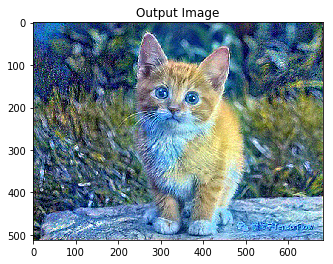

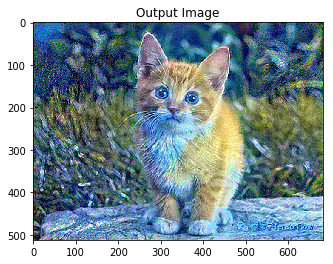

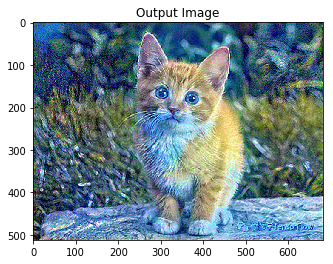

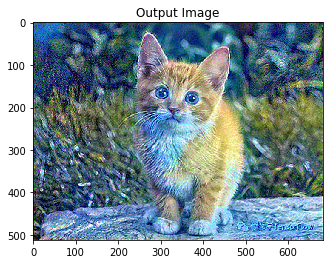

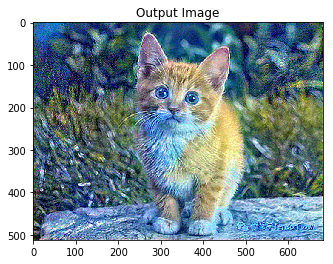

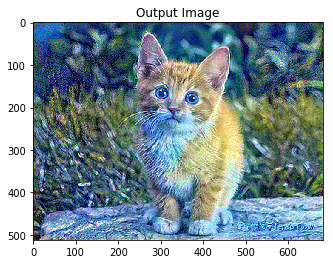

In [28]:
outputs, style_loss, cont_loss = run_style_transfer(premodel, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=steps, content_layers=CONTENT_LAYERS, style_layers=STYLE_LAYERS, init_norm=False)

for out in outputs:
    plt.figure()
    imshow(out, title='Output Image')

    # sphinx_gallery_thumbnail_number = 4
    plt.ioff()
    plt.show()

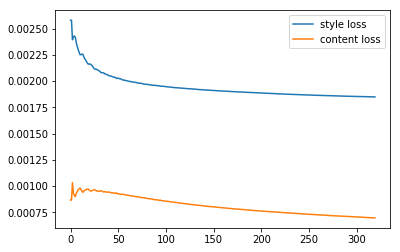

In [29]:
ax = plt.subplot(111)

t = np.arange(0, 320, 1)
line, = plt.plot(t, style_loss, label='style loss')
line, = plt.plot(t, cont_loss, label='content loss')
plt.legend(loc='best')
plt.show()

## VGG19 without BN, with init_Norm, style loss layer after relu discard first layer

In [33]:
CONTENT_LAYERS = ('relu_10', 'relu_14')
STYLE_LAYERS = ('relu_2' 'relu_3', 'relu_5', 'relu_9', 'relu_13')
premodel = cnn_vgg19
steps = 300

Building the style transfer model..
Sequential(
  (0): Normalization()
  (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_1): ReLU()
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_2): ReLU()
  (pool_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_3): ReLU()
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_4): ReLU()
  (pool_4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_5): ReLU()
  (style_loss_5): StyleLoss()
  (conv_6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_6): ReLU()
  (conv_7): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_7): ReLU()
  (conv_8): Conv2d(256, 256, kernel_si

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


run [50]:
Style Loss : 0.727488 Content Loss: 1.301444
run [100]:
Style Loss : 0.724249 Content Loss: 1.288368
run [150]:
Style Loss : 0.721406 Content Loss: 1.277536
run [200]:
Style Loss : 0.718948 Content Loss: 1.268021
run [250]:
Style Loss : 0.717564 Content Loss: 1.259370
run [300]:
Style Loss : 0.716178 Content Loss: 1.251688


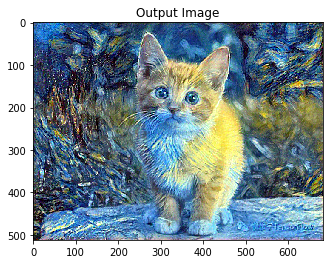

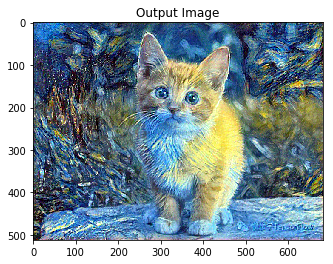

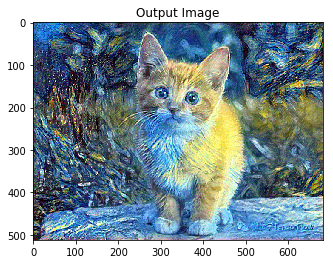

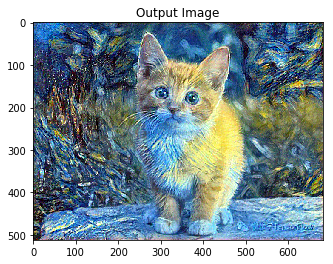

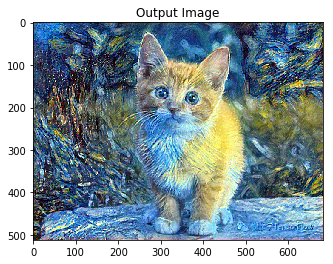

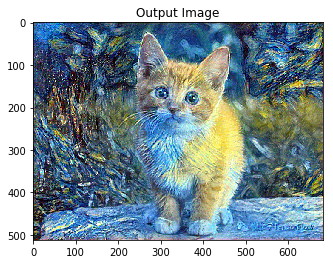

In [34]:
outputs, style_loss, cont_loss = run_style_transfer(premodel, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=steps, content_layers=CONTENT_LAYERS, style_layers=STYLE_LAYERS)

for out in outputs:
    plt.figure()
    imshow(out, title='Output Image')

    # sphinx_gallery_thumbnail_number = 4
    plt.ioff()
    plt.show()

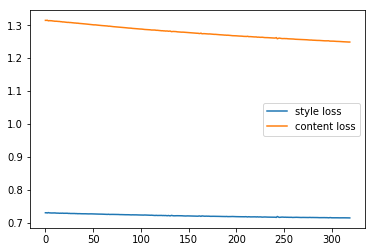

In [35]:
ax = plt.subplot(111)

t = np.arange(0, 320, 1)
line, = plt.plot(t, style_loss, label='style loss')
line, = plt.plot(t, cont_loss, label='content loss')
plt.legend(loc='best')
plt.show()

## RESNET34 with init_Norm, uniform style loss layer after first BasicBlock of each layer

In [39]:
input_img = content_img.clone()
CONTENT_LAYERS = ('botnet4_2')
STYLE_LAYERS = ('botnet1_1', 'botnet2_1', 'botnet3_1', 'botnet4_1')
premodel = cnn_res34
steps = 300
nettype = ("res", 34)

Building the style transfer model..
Sequential(
  (0): Normalization()
  (conv_start): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn_start): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu_start): ReLU()
  (pool_start): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (botnet1_1): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (style_loss_1): StyleLoss()
  (botnet1_2): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


run [50]:
Style Loss : 0.086044 Content Loss: 0.026828
run [100]:
Style Loss : 0.057183 Content Loss: 0.015963
run [150]:
Style Loss : 0.049012 Content Loss: 0.012602
run [200]:
Style Loss : 0.045339 Content Loss: 0.010838
run [250]:
Style Loss : 0.043357 Content Loss: 0.009866
run [300]:
Style Loss : 0.042102 Content Loss: 0.009361


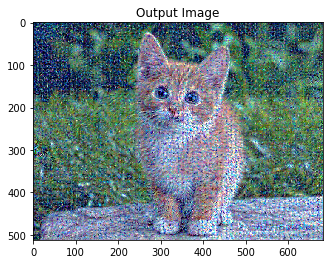

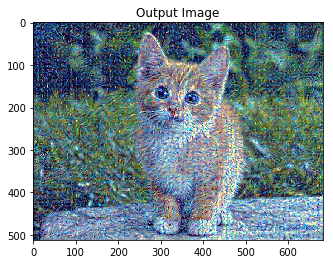

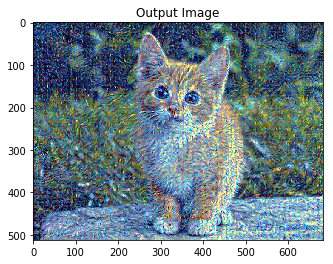

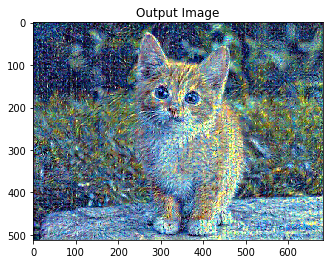

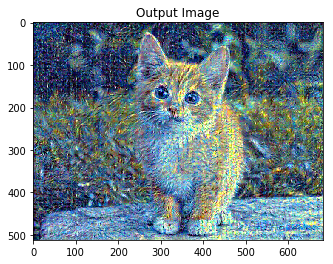

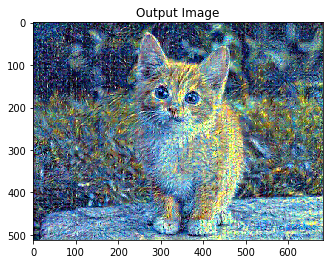

In [40]:
outputs, style_loss, cont_loss = run_style_transfer(premodel, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, net_type=nettype, num_steps=steps, content_layers=CONTENT_LAYERS, style_layers=STYLE_LAYERS)

for out in outputs:
    plt.figure()
    imshow(out, title='Output Image')

    # sphinx_gallery_thumbnail_number = 4
    plt.ioff()
    plt.show()

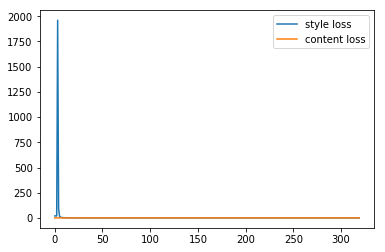

In [41]:
ax = plt.subplot(111)

t = np.arange(0, 320, 1)
line, = plt.plot(t, style_loss, label='style loss')
line, = plt.plot(t, cont_loss, label='content loss')
plt.legend(loc='best')
plt.show()

## RESNET34 without init_Norm, uniform style loss layer after first BasicBlock of each layer

In [44]:
input_img = content_img.clone()
CONTENT_LAYERS = ('botnet4_2')
STYLE_LAYERS = ('botnet1_1', 'botnet2_1', 'botnet3_1', 'botnet4_1')
premodel = cnn_res34
steps = 300
nettype = ("res", 34)

Building the style transfer model..
Sequential(
  (conv_start): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn_start): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu_start): ReLU()
  (pool_start): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (botnet1_1): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (style_loss_1): StyleLoss()
  (botnet1_2): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_sta

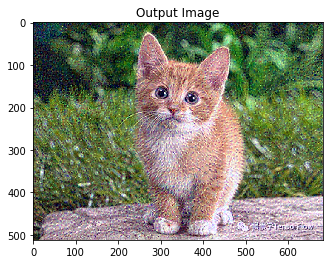

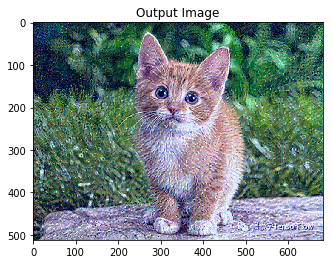

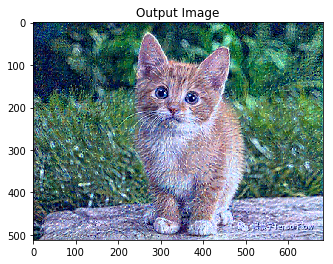

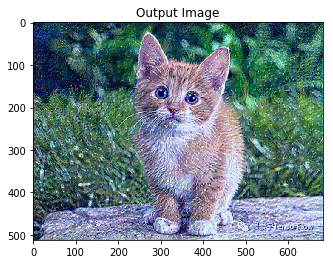

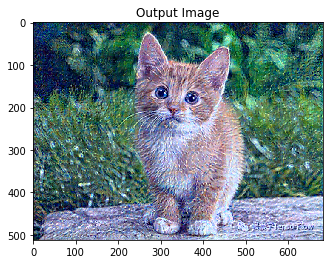

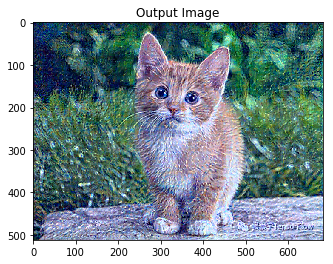

In [45]:
outputs, style_loss, cont_loss = run_style_transfer(premodel, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, net_type=nettype, num_steps=steps, content_layers=CONTENT_LAYERS, style_layers=STYLE_LAYERS, init_norm=False)

for out in outputs:
    plt.figure()
    imshow(out, title='Output Image')

    # sphinx_gallery_thumbnail_number = 4
    plt.ioff()
    plt.show()

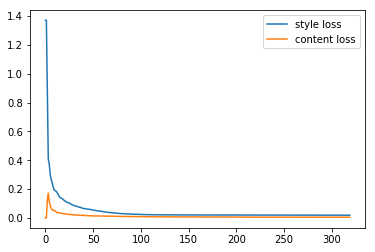

In [46]:
ax = plt.subplot(111)

t = np.arange(0, 320, 1)
line, = plt.plot(t, style_loss, label='style loss')
line, = plt.plot(t, cont_loss, label='content loss')
plt.legend(loc='best')
plt.show()

## RESNET34 with init_Norm, discard style loss layer after first BasicBlock of first layer

In [47]:
input_img = content_img.clone()
CONTENT_LAYERS = ('botnet4_2')
STYLE_LAYERS = ('botnet2_1', 'botnet3_1', 'botnet4_1')
premodel = cnn_res34
steps = 300
nettype = ("res", 34)

Building the style transfer model..
Sequential(
  (0): Normalization()
  (conv_start): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn_start): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu_start): ReLU()
  (pool_start): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (botnet1_1): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (botnet1_2): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


run [50]:
Style Loss : 0.132690 Content Loss: 0.019389
run [100]:
Style Loss : 0.059776 Content Loss: 0.012854
run [150]:
Style Loss : 0.046520 Content Loss: 0.009083
run [200]:
Style Loss : 0.043309 Content Loss: 0.007772
run [250]:
Style Loss : 0.041914 Content Loss: 0.007226
run [300]:
Style Loss : 0.041109 Content Loss: 0.006943


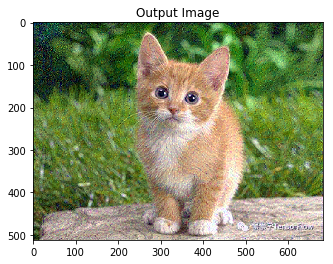

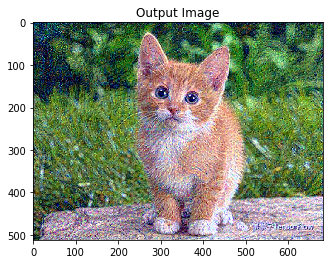

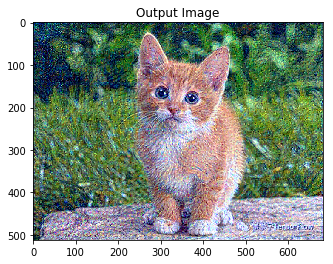

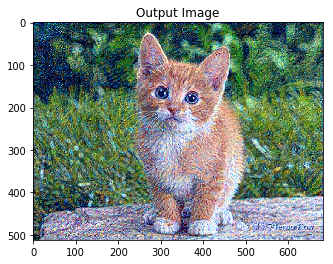

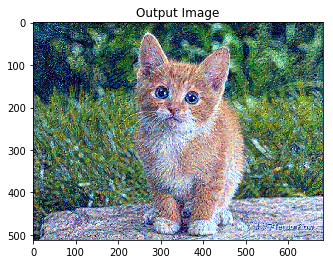

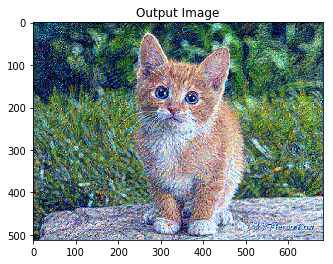

In [48]:
outputs, style_loss, cont_loss = run_style_transfer(premodel, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, net_type=nettype, num_steps=steps, content_layers=CONTENT_LAYERS, style_layers=STYLE_LAYERS)

for out in outputs:
    plt.figure()
    imshow(out, title='Output Image')

    # sphinx_gallery_thumbnail_number = 4
    plt.ioff()
    plt.show()

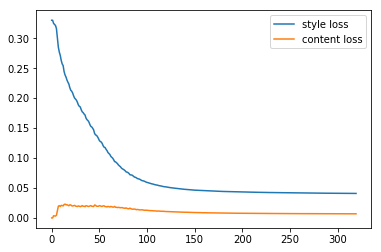

In [49]:
ax = plt.subplot(111)

t = np.arange(0, 320, 1)
line, = plt.plot(t, style_loss, label='style loss')
line, = plt.plot(t, cont_loss, label='content loss')
plt.legend(loc='best')
plt.show()

## RESNET34 with init_Norm, discard style loss layer after first BasicBlock of first layer

In [50]:
input_img = content_img.clone()
CONTENT_LAYERS = ('botnet3_2')
STYLE_LAYERS = ('botnet1_1', 'botnet2_1', 'botnet3_1')
premodel = cnn_res34
steps = 300
nettype = ("res", 34)

Building the style transfer model..
Sequential(
  (0): Normalization()
  (conv_start): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn_start): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu_start): ReLU()
  (pool_start): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (botnet1_1): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (style_loss_1): StyleLoss()
  (botnet1_2): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


run [50]:
Style Loss : 0.021030 Content Loss: 0.018192
run [100]:
Style Loss : 0.005142 Content Loss: 0.010343
run [150]:
Style Loss : 0.003185 Content Loss: 0.007861
run [200]:
Style Loss : 0.002638 Content Loss: 0.006671
run [250]:
Style Loss : 0.002414 Content Loss: 0.005971
run [300]:
Style Loss : 0.002307 Content Loss: 0.005535


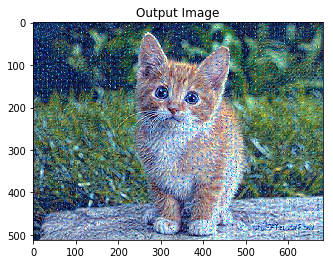

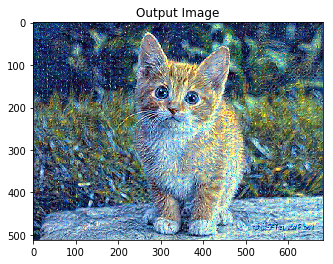

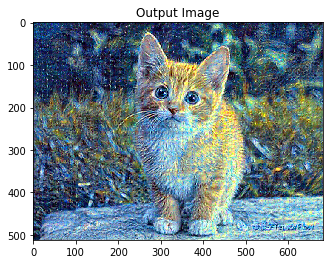

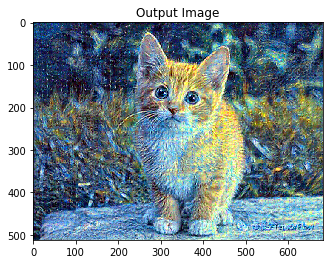

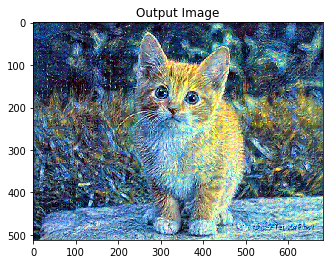

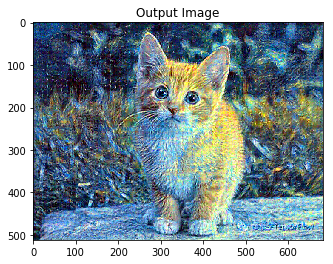

In [51]:
outputs, style_loss, cont_loss = run_style_transfer(premodel, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, net_type=nettype, num_steps=steps, content_layers=CONTENT_LAYERS, style_layers=STYLE_LAYERS)

for out in outputs:
    plt.figure()
    imshow(out, title='Output Image')

    # sphinx_gallery_thumbnail_number = 4
    plt.ioff()
    plt.show()

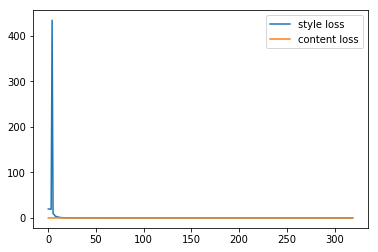

In [52]:
ax = plt.subplot(111)

t = np.arange(0, 320, 1)
line, = plt.plot(t, style_loss, label='style loss')
line, = plt.plot(t, cont_loss, label='content loss')
plt.legend(loc='best')
plt.show()

## RESNET152 with init_Norm, uniform style loss layer after first BasicBlock of each layer

In [60]:
input_img = content_img.clone()
CONTENT_LAYERS = ('botnet4_2')
STYLE_LAYERS = ('botnet1_1', 'botnet2_8', 'botnet3_16', 'botnet4_1')
premodel = cnn_res151
steps = 300
nettype = ("res", 152)

Building the style transfer model..


/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


Sequential(
  (0): Normalization()
  (conv_start): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn_start): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu_start): ReLU()
  (pool_start): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (botnet1_1): Bottleneck(
    (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (downsample): Sequential(
      (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bia

run [50]:
Style Loss : 0.012894 Content Loss: 0.000884
run [100]:
Style Loss : 0.010219 Content Loss: 0.001302
run [150]:
Style Loss : 0.008549 Content Loss: 0.001389
run [200]:
Style Loss : 0.007381 Content Loss: 0.001382
run [250]:
Style Loss : 0.006616 Content Loss: 0.001334
run [300]:
Style Loss : 0.006065 Content Loss: 0.001281


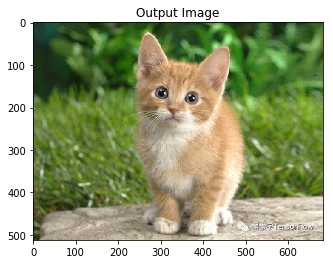

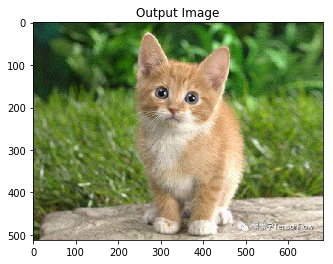

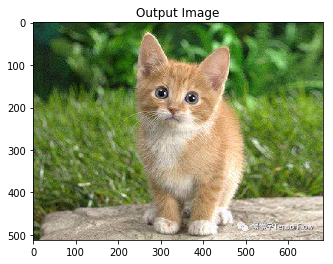

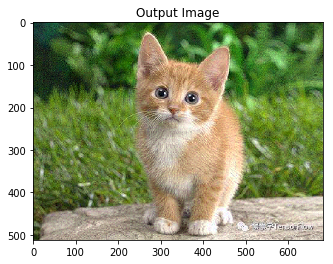

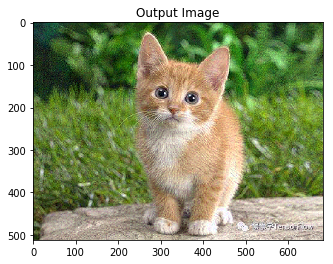

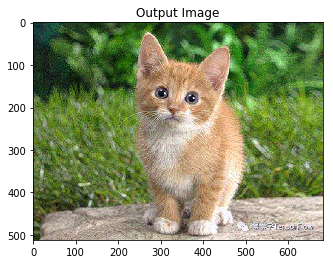

In [61]:
outputs, style_loss, cont_loss = run_style_transfer(premodel, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, net_type=nettype, num_steps=steps, content_layers=CONTENT_LAYERS, style_layers=STYLE_LAYERS)

for out in outputs:
    plt.figure()
    imshow(out, title='Output Image')

    # sphinx_gallery_thumbnail_number = 4
    plt.ioff()
    plt.show()

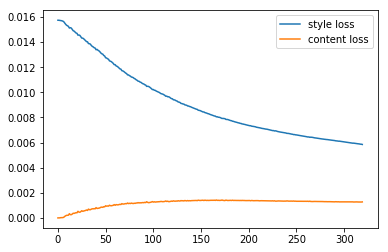

In [62]:
ax = plt.subplot(111)

t = np.arange(0, 320, 1)
line, = plt.plot(t, style_loss, label='style loss')
line, = plt.plot(t, cont_loss, label='content loss')
plt.legend(loc='best')
plt.show()